# TF Siamese Neural Network for Identifying Architectural Style of Buildings Facades

**AUTHOR: CAMELIA CIOLAC**  
ciolac_c@inria-alumni.fr

In this mini-project we train a Tensorflow model to identify the  architectural style of a church facade. Initially we include three styles :
- "CLASSIC" : Classic , Classical Revival , Neo-Classic
- "GOTHIC" : Gothic , Neo-Gothic
- "BAROQUE" : Baroque , Rococo, Baroque Revival

Moreover, we use only a few exemplars per class (i.e. class representatives / seeds) and perform few-shot learning via a Siamese Neural Network.



In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
from IPython.core.display import display, HTML
#display(HTML("<style>.container { width:100% !important; }</style>"))

from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle, Circle
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import axes3d

import seaborn as sns
%matplotlib inline

In [ ]:
!mkdir -p "/content/gdrive/My Drive/architecture_fsl"

In [ ]:
!sudo apt-get install tree > /dev/null 2>&1


In [ ]:
import pandas as pd
import numpy as np
import math
import scipy.interpolate
import scipy.stats
from sklearn.model_selection import train_test_split

from PIL import Image as pilim
import collections as coll

import pprint
from tabulate import tabulate

import glob
import json
import shutil

from multiprocessing import Pool
import shlex
import tempfile
import subprocess

import re

import umap

import cv2
cv2.__version__

'4.1.2'

In [ ]:
import os
#logging levels : 0 = INFO , 1 = WARN , 2 = ERROR, 3 = none (not used in TF2)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' 

import tensorflow as tf
from tensorflow.python.lib.io import file_io
import tensorflow_hub as hub
print("TF version:", tf.__version__)

#logging level for TF2
tf.get_logger().setLevel('ERROR')

#devices discovered by TF2
physical_devices = tf.config.list_physical_devices()
for pdev in physical_devices:
  print(pdev)


import tensorflow_addons as tfa

TF version: 2.3.0
PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')
PhysicalDevice(name='/physical_device:XLA_CPU:0', device_type='XLA_CPU')
PhysicalDevice(name='/physical_device:XLA_GPU:0', device_type='XLA_GPU')
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [ ]:
#GPU info - NVIDIA System Management Interface
!nvidia-smi 

Sat Dec  5 11:14:45 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.45.01    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P0    27W / 250W |     10MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import warnings

with warnings.catch_warnings():
    warnings.filterwarnings("ignore",category=DeprecationWarning)
    warnings.filterwarnings("ignore",category=FutureWarning)
    

## Download a set of images

In [ ]:
dict_images_dw = {
    "baroque":[
       {"url": "https://files.structurae.net/files/photos/1/igreja_dos_clerigos-_em_portugal_porto.jpg", "name": "Clerigos Church, Porto"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/b/ba/Puglia_Lecce3_tango7174.jpg", "name": "Santa Croce Church, Lecce"},
       {"url": "https://mapio.net/images-p/42506036.jpg", "name": "Cathedral Church of Saint Mary, Murcia"},
       {"url": "https://www.bordeaux-hotel.com/wp-content/uploads/2017/10/notre-dame.jpg", "name": "Eglise Notre-Dame, Bordeaux"},
       {"url": "https://www.parismarais.com/img/editor/15418098479_251d9c78b7_b.jpg", "name": "Eglise Saint Paul-Saint Louis, Paris"},
       {"url": "https://www.wondersofsicily.com/images/700x1000-Siracusa-Duomo-20140604_Torild-Egge_7512.jpg", "name": "Dome Of Siracusa"},
       {"url": "https://i.pinimg.com/originals/bb/ae/ce/bbaeceec11dc1ca0887b427e8414fe71.jpg", "name": "Chiesa del Gesu, Rome"},
       {"url": "https://colosseumrometickets.com/wp-content/uploads/2018/10/Church-of-the-Ges%C3%B9.jpg", "name": "Chiesa del Gesu, Rome"},
       {"url": "https://www.sposisicilia.com/media/k2/items/cache/97d2860871f3d35e35f6eb0477d3015a_XL.jpg", "name": "Chiesa di Santa Maria della Pieta, Palermo"},
       {"url": "https://i.pinimg.com/originals/66/86/f0/6686f0b155b721bedfc01fd770a29d31.jpg", "name": "Basilica di Santa Maria della Salute, Venice"},
       {"url": "https://thumbs.dreamstime.com/b/basilica-di-santa-maria-della-salute-venice-november-november-venice-italy-s-roman-catholic-church-minor-64498588.jpg", "name": "Basilica di Santa Maria della Salute, Venice"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/9/9c/The_Val-de-Grace.jpg", "name": "Catholic Church of the Val-de-Grace, Paris"},
       {"url": "https://cdn.britannica.com/18/123418-050-AB979128/Church-Paris-Val-de-Grace-Jacques-Lemercier-Francois-Mansart.jpg", "name": "Catholic Church of the Val-de-Grace, Paris"},
       {"url": "https://www.au-temps-pour-moi.fr/IMG/jpg/04_l_eglise_du_val_de_grace_a_ete_dessinee_par_francois_mansart_a_la_demande_de_anne_d_autriche.jpg", "name": "Catholic Church of the Val-de-Grace, Paris"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/5/55/Colonna_-_S_Maria_Maddalena.JPG", "name": "Santa Maria Maddalena, Rome"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/e/e3/Chiesa_di_Santa_Maria_Maddalena_Roma.JPG", "name": "Santa Maria Maddalena, Rome"},
       {"url": "https://pbs.twimg.com/media/CIv8xvnWwAA8byB.jpg", "name": "Chiesa di San Carlino alle Quattro Fontane, Rome"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/0/0e/Santa_Susanna_%28Rome%29.jpg", "name": "Santa Susanna alle Terme di Diocleziano, Rome"},
       {"url": "https://guias-viajar.com/wp-content/uploads/2017/05/murcia-catedral-005-1.jpg", "name": "Cathedral Church of Saint Mary, Murcia"},
       {"url": "https://i.pinimg.com/originals/64/29/ee/6429ee86302338d2799f85ab1c0efaed.jpg", "name": "Cathedral of the Incarnation in Guadix"},
       {"url": "https://www.eccellenzesiciliane.it/images/territorio/catania/catania/catania_collegiata.jpg", "name": "Basilica della Collegiata, Catania"},
       {"url": "https://enthusiastical.files.wordpress.com/2013/05/v061124-057a.jpg", "name": "Basilica di Santa Maria della Salute, Venice"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/0/04/Chiesa_di_San_Moise.jpg", "name": " Chiesa di San Moise, Venice"},
       {"url": "https://mapio.net/images-p/20141571.jpg", "name": "Sint-Michielskerk, Leuven"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/1/12/Leuven_Sint-Michielskerk.jpg", "name": "Sint-Michielskerk, Leuven"},
       {"url": "https://i.pinimg.com/originals/3b/3a/f9/3b3af9b8c5b3f72a14dc878f6fa4c241.jpg", "name": "Sint-Michielskerk, Leuven"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/5/54/Cathedral_Ragusa_Ibla.JPG", "name":"Ragusa Cathedral San Giorgio, Ragusa"},
       {"url": "https://i.pinimg.com/originals/ee/53/68/ee5368879ef9fdbc00c1cd87788ceb37.jpg", "name": "Eglise Saint-Gervais-Saint-Protais, Paris"},
       {"url": "https://www.parismarais.com/img/editor/P1240932_Paris_IV_eglise_St-Gervais-St-Protais_facade_rwk.jpg", "name": "Eglise Saint-Gervais-Saint-Protais, Paris"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/e/e2/Santa_croce_lecce.jpg", "name": "Santa Croce Church, Lecce"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/d/d9/Gozo_-_Xewkija_-_Church.JPG", "name": "Church of St. John The Baptist Xewkija, Gozo"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/2/2d/Versailles_eglise_notre-dame.jpg", "name": "Church of Notre-Dame, Versailles"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ec/Modica-SGiorgio.jpg/1200px-Modica-SGiorgio.jpg", "name":"Duomo of San Giorgio, Modica"},
       {"url": "https://ttnotes.com/images/chiesa-di-santa-maria-del-giglio-venice-5.jpg", "name":"Chiesa di Santa Maria del Giglio (Zobenigo), Venice"},
       {"url":"https://ermakvagus.com/Europe/Italy/Venice/New%20folder%20(3)/63464594512.jpg", "name":"Chiesa di Santa Maria del Giglio (Zobenigo), Venice"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/e/e9/Lecce_san_giovanni_battista.jpg", "name":"Chiesa di San Giovanni Battista, Lecce"},
       {"url":"https://upload.wikimedia.org/wikipedia/commons/2/2f/Chiesa_di_San_Giovanni_Battista%2C_Monterosso_Almo.jpg", "name":"Chiesa di San Giovanni Battista, Monterosso"},
       {"url":"https://www.ragusaoggi.it/wp-content/uploads/2020/06/La-Cattedrale-di-San-Giovanni-Battista-a-Ragusa-foto.jpg", "name": "Cattedrale San Giovanni Battista, Ragusa"},
       {"url":"https://www.consumelessmed.org/file/2019/03/San-Giorgio-3.jpg", "name":"Ragusa Cathedral San Giorgio, Ragusa"},
       {"url":"https://i.pinimg.com/originals/87/90/de/8790dec9551959b77d9aadd2d1313f21.jpg", "name":"Chiesa di San Giacomo, Caltagirone"},
       {"url": "https://i.pinimg.com/736x/8d/90/c0/8d90c02377cf09059714c651a1eaa363.jpg", "name": "Chiesa di Santa Maria Maddalena, Buccheri"},
       {"url": "https://online.scuola.zanichelli.it/artemondo-blog/wp-content/uploads/2019/04/barocco-scicli.jpg", "name":"Chiesa San Bartolomeo, Scicli"},
       {"url": "https://online.scuola.zanichelli.it/artemondo-blog/wp-content/uploads/2019/04/barocco-roma.jpg", "name":"Chiesa Sant’Ignazio, Roma"},
       {"url":"https://online.scuola.zanichelli.it/artemondo-blog/wp-content/uploads/2019/04/barocco-modica.jpg", "name":"Chiesa San Giorgio, Modica"},
       {"url":"https://online.scuola.zanichelli.it/artemondo-blog/wp-content/uploads/2019/04/barocco-ragusa.jpg", "name":"Duomo di San Giorgio, Ragusa"},
       {"url":"https://it.latuaitalia.ru/images/sicilia/palermobarocco/6.jpg", "name":"Chiesa di San Domenico, Palermo"},
       {"url":"https://i.pinimg.com/originals/5f/8b/3f/5f8b3fe92fc6677edf4515b8aaaecb69.jpg", "name":"Chiesa  Santi Pietro e Paolo"},
       {"url": "https://www.carmeloveneto.it/joomla/images/immagini_12/DSC039541_per_sito.jpg", "name":"Chiesa degli Scalzi, Venezia"},
       {"url": "https://www.carmeloveneto.it/joomla/images/immagini_12/2012_Facciata_generale.jpg", "name": "Chiesa degli Scalzi, Venezia"}

    ],
    "classic":[
       {"url": "https://i.pinimg.com/originals/00/2f/fc/002ffc7f9c8a347466efea8e72df4028.jpg", "name": "Pantheon, Paris"},
       {"url": "https://mikestravelguide.com/wp-content/uploads/2019/03/Facade-Saint-Sulpice-Paris.jpg", "name": "Eglise Saint-Sulpice, Paris"},    
       {"url": "https://cdn.britannica.com/65/136865-050-8CFCF8DD/roof-London-St-Pauls-Cathedral.jpg", "name": "Saint Paul's Cathedra, London"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/thumb/2/27/Baltimore_basilica_exterior.JPG/1280px-Baltimore_basilica_exterior.JPG", "name": "Baltimore Basilica"},
       {"url": "https://www.reisroutes.be/userfiles/fotos/st-nikolaikirche-potsdam_7571_xl.jpg", "name": "Sankt Nikolaus Kirche, Potsdam"},
       {"url": "https://i.pinimg.com/originals/e8/dc/d6/e8dcd6549e306ba9ef04373bedffb009.jpg", "name": "Saint Paul's Cathedra, London"},
       {"url": "https://www.paris.catholique.fr/local/cache-vignettes/L690xH690/arton51086-d4ebe.jpg", "name": "Eglise Saint-Sulpice, Paris"},
       {"url": "https://lp-cms-production.imgix.net/2019-06/4e12501d5e8b66b2b4b2bf830246ed92-trinity-cathedral.jpg", "name": "Trinity Cathedral, St Petersburg"},
       {"url": "https://p0.pikist.com/photos/451/827/helsinki-cathedral-cathedral-architecture-church-europe-finland-city-travel-finnish.jpg", "name": "Helsinki Cathedral"},
       {"url": "https://p0.pikist.com/photos/602/851/helsinki-cathedral-architecture-church-city-building-landmark-scandinavia-capital.jpg", "name": "Helsinki Cathedral"},
       {"url": "https://i.pinimg.com/originals/8b/9a/eb/8b9aeb03d5948cce0ae757f4c4e4d6b7.jpg", "name": "Rotunda of Mosta, Il-Mosta"},   
       {"url": "https://upload.wikimedia.org/wikipedia/commons/c/ca/Basilica_of_the_Immaculate_Conception_-_Waterbury%2C_Connecticut_01.jpg", "name": "Basilica of the Immaculate Conception, Waterbury Connecticut"}, 
       {"url": "https://files.structurae.net/files/photos/2018/roche_sur_yon/dscf2080.jpg", "name": "Eglise Saint-Louis, Roche-sur-Yon"},  
       {"url": "https://stlgs.org/media/Congregations/Catholic/R00826-Basilica-of-St-Louis.jpg", "name":"OLd Cathedral, Saint Louis"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/1/1d/StPeterInChains.jpg", "name": "Cathedral Basilica of Saint Peter, Chains Cincinnati "},
       {"url": "https://ro.zooverresources.com/images/E291434L7B2324385D0W900H675/Helsinki-Cathedral-Tuomiokirkko.jpg", "name":"Helsinki Cathedral"},
       {"url": "https://1.bp.blogspot.com/-DSQwyPweIOw/VVpCAE-6jjI/AAAAAAAAGEc/obWvw91Kgoo/s1600/IMG_0095.JPG", "name": "Cathedral of the Sacred Heart, Richmond Virginia"},  
       {"url": "https://i1.sndcdn.com/avatars-000147897875-1j422z-t500x500.jpg", "name": "St. Andrew's Church, Egmore Chenna"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/thumb/0/04/St_Andrews_Church_-_The_Kirk.jpg/2721px-Mapcarta.jpg", "name": "St. Andrew's Church, Egmore Chenna"}    
    ],
    "gothic":[
        {"url": "http://medieval.mrugala.net/Architecture/France,_Loiret,_Orleans,_Cathedrale_Sainte-Croix/Orleans%20-%20Cathedrale%20Sainte%20Croix%20-%20Facade%20(2).jpg", "name": "Cathedrale Sainte-Croix , Orleans"},
        {"url": "https://images.yourfaithstory.org/wp-content/uploads/sites/6/2019/12/10144912/st-john-divine.jpg", "name": "The Cathedral Church of St. John the Divine, New York"},
        {"url": "https://i.pinimg.com/originals/1f/9b/97/1f9b977081e0f5ae5f7f82e7ca637af9.jpg", "name": "Cathedrale Notre-Dame, Reims"},
        {"url": "https://3iqhm91wtiv21y4zza4dqwj2-wpengine.netdna-ssl.com/wp-content/uploads/England-London-Westminster-Abbey-961x1440.jpg", "name": "Westminster Abbey, London"},
        {"url": "https://upload.wikimedia.org/wikipedia/commons/thumb/a/af/Notre-Dame_de_Paris_2013-07-24.jpg/1200px-Notre-Dame_de_Paris_2013-07-24.jpg", "name": "Cathedrale Notre-Dame, Paris"},
        {"url": "https://media.architecturaldigest.com/photos/585abd711f906f61574e60ad/1:1/w_1533,h_1533,c_limit/gothic-cathedrals-06.jpg", "name": "Westminster Abbey, London"},
        {"url": "https://i.pinimg.com/originals/f3/8c/f3/f38cf36b2b350c2f747dba153325f59a.jpg", "name": "Cathedrale Notre-Dame, Reims"},
        {"url": "https://upload.wikimedia.org/wikipedia/commons/a/a3/Orl%C3%A9ans_-_cath%C3%A9drale%2C_ext%C3%A9rieur_%2818%29.jpg", "name": "Cathedrale Sainte-Croix , Orleans"},
        {"url": "https://upload.wikimedia.org/wikipedia/commons/thumb/7/7d/Cathedrale_d%27Orleans.jpg/1200px-Cathedrale_d%27Orleans.jpg", "name": "Cathedrale Sainte-Croix , Orleans"},
        {"url": "https://sure-shot-video.com/uploads/3/4/9/0/34901906/medranowedding-0_orig.jpg", "name": "St. Francis Xavier College Church, St Louis, Missouri"},
        {"url": "https://www.ospreyobserver.com/wp-content/uploads/2019/03/church-2-2.jpg", "name": "Cathedral Basilica of the Sacred Heart, Newark"},
        {"url": "https://upload.wikimedia.org/wikipedia/commons/1/13/Cathedral_Basilica_of_Sacred_Heart.jpg", "name": "Cathedral Basilica of the Sacred Heart, Newark"},
        {"url": "https://www.ellisandco.uk.com/userfiles/products/e_39-1.jpg", "name":"Wells Cathedral"},
        {"url": "https://media-cdn.tripadvisor.com/media/photo-m/1280/1c/03/cc/71/photo0jpg.jpg", "name":"Nidaros Cathedral, Trondheim"},
        {"url": "https://i.pinimg.com/originals/7f/c8/9a/7fc89af8f6da803d6ae33057600dbd0f.jpg", "name":"Church of St. Ouen, Rouen"},
        {"url": "https://www.gentlemansgazette.com/wp-content/uploads/2013/12/Church-of-Saint-Ouen-Rouen-France-675x900.jpg", "name":"Church of St. Ouen, Rouen"},
        {"url": "https://openchurches.eu/img/947_1_1_1538645021.JPG?w=2048&h=2048", "name":"Church of Sint-Petrus en Paulus, Oostende"},
        {"url": "https://media-cdn.tripadvisor.com/media/photo-m/1280/1c/35/c9/ec/catedral-de-burgos.jpg", "name":"Cathedral Saint Mary, Burgos"},
        {"url": "https://upload.wikimedia.org/wikipedia/commons/4/4d/St._Mary%27s_Cathedral_Basilica_of_the_Assumption_in_Covington%2C_KY.JPG", "name": "Cathedral Basilica of the Assumption, Covington  Kentucky"},
        {"url": "https://whc.unesco.org/uploads/thumbs/site_0081_0001-750-0-20151104132433.jpg", "name": "Chartres Cathedral, Chartres"},
        {"url": "https://i.pinimg.com/originals/b3/11/7d/b3117d4ce8b78454177a0c97e258608b.jpg", "name":"Notre-Dame de Reims, Reims"},
        {"url": "https://www.kornbluthphoto.com/images/CanterburyCathExt_36-37-1.jpg", "name":"Canterbury Cathedral,Canterbury"},
        {"url": "https://i.pinimg.com/originals/67/54/8c/67548c6324a0ea78d18ecae37446f7ff.jpg", "name":"Sydney St Mary's Cathedral, Sydney"}
    ]
}



In [ ]:
!mkdir -p "/content/gdrive/My Drive/architecture_fsl/all_images"
!mkdir -p "/content/gdrive/My Drive/architecture_fsl/seeds"

In [ ]:
FOLDER_IMAGES = "/content/gdrive/My Drive/architecture_fsl/all_images/"

FOLDER_SEEDS = "/content/gdrive/My Drive/architecture_fsl/seeds/"

Whereas in other notebooks we've used bash scripts or the requests package in Python,now we execute bash commands in subprocess

In [ ]:
#sidenote - how it works
#suppose want to execute the wget
cmd = 'wget -q "https://www.wondersofsicily.com/images/700x1000-Siracusa-Duomo-20140604_Torild-Egge_7512.jpg" -O "/content/gdrive/My Drive/architecture_fsl/all_images/aux.jpg"'

list_cmd_parts = shlex.split(cmd)
print(list_cmd_parts)

temp1 = tempfile.TemporaryFile()
sp1 = subprocess.Popen(list_cmd_parts, shell=False, stdout=subprocess.PIPE, stderr=temp1)

['wget', '-q', 'https://www.wondersofsicily.com/images/700x1000-Siracusa-Duomo-20140604_Torild-Egge_7512.jpg', '-O', '/content/gdrive/My Drive/architecture_fsl/all_images/aux.jpg']


In [ ]:
!rm -f "/content/gdrive/My Drive/architecture_fsl/all_images/aux.jpg"

In [ ]:
for k,v in dict_images_dw.items():
    assert isinstance(v, list)
    for ii, item in enumerate(v):
        #print( k, ii, v[ii]["url"])
        target_file = FOLDER_IMAGES + k + str(ii)
        cmd = 'wget -q "{}" -O "{}.jpg"'.format(v[ii]["url"], target_file) 
        list_cmd_parts = shlex.split(cmd)
        temp1 = tempfile.TemporaryFile()

        sp1 = subprocess.Popen(list_cmd_parts, shell=False, stdout=subprocess.PIPE, stderr=temp1)


In [ ]:
%%bash -s "$FOLDER_IMAGES"

#number of files in folder (+1 for the folder itself)
echo $1
ls -l "$1" | wc -l

/content/gdrive/My Drive/architecture_fsl/all_images/
92


Copy seeds to another folder:

In [ ]:
#take 10 of each class
selected_seeds = ["baroque2.jpg", "baroque3.jpg", "baroque5.jpg", "baroque8.jpg", "baroque12.jpg", 
                  "baroque22.jpg", "baroque23.jpg", "baroque26.jpg", "baroque30.jpg", "baroque37.jpg", 
                  "classic0.jpg", "classic1.jpg", "classic4.jpg", "classic5.jpg", "classic9.jpg", 
                  "classic10.jpg", "classic11.jpg", "classic13.jpg", "classic15.jpg", "classic16.jpg", 
                  "gothic2.jpg", "gothic4.jpg", "gothic6.jpg", "gothic8.jpg", "gothic9.jpg",
                  "gothic10.jpg", "gothic13.jpg", "gothic14.jpg", "gothic17.jpg", "gothic21.jpg",
                  ]

for seed_file in selected_seeds:
    shutil.copy2(FOLDER_IMAGES + seed_file, FOLDER_SEEDS + seed_file)

In [ ]:
%%bash -s "$FOLDER_SEEDS"

#number of files in folder (+1 for the folder itself)
echo $1
ls -l "$1" | wc -l

/content/gdrive/My Drive/architecture_fsl/seeds/
31


In [ ]:
def visualize_sample_images(num_images_to_visualize, target_folder, savefile = None):
    """ Visualize a random sample of size num_images_to_visualize from
        the images in folder target_folder, saving the resulted collage figure to 
        the path specified in savefile
    """

    num_cols_plot = 10
    num_rows_plot = math.ceil(num_images_to_visualize/num_cols_plot)

    fig = plt.figure(figsize=(num_cols_plot * 2.5, num_rows_plot * 3.5))

    list_jpgfiles = glob.glob(target_folder + '/*.jpg')
    #sample without replacement
    list_jpgfiles_sample = np.random.choice(np.array(list_jpgfiles), 
                                            size = num_images_to_visualize,
                                            replace=False)
    #sort by name
    list_jpgfiles_sample_sorted = sorted(list_jpgfiles_sample, key=lambda x: x.split("/")[-1])

    for ii in range(num_images_to_visualize):
        ax = fig.add_subplot(num_rows_plot, num_cols_plot,ii+1)
        jpgfile = list_jpgfiles_sample_sorted[ii]
        im = pilim.open(jpgfile)
        ax.imshow(im)
        ax.set_title(jpgfile.split("/")[-1])

    fig.tight_layout()
    if savefile is not None:
        fig.savefig(savefile)
    return list_jpgfiles_sample

The entire set of images that'll be used in training, with 10 seeds (representatives)  per class:

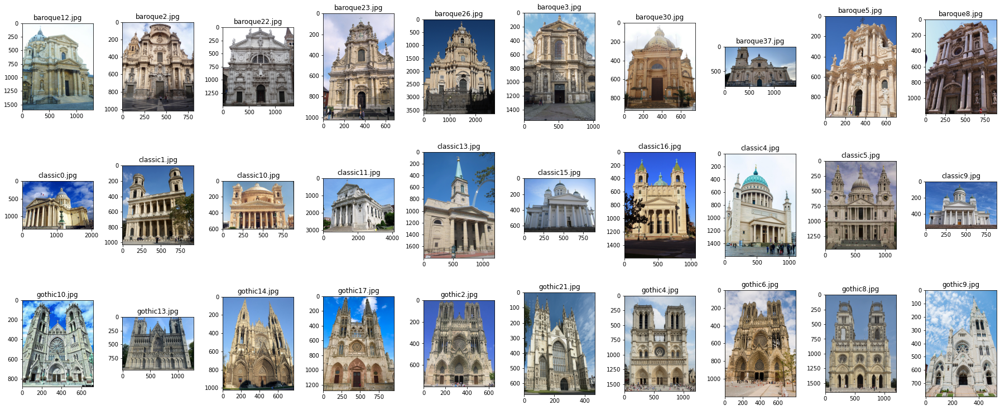

In [ ]:
list_jpgfiles_sample = visualize_sample_images(num_images_to_visualize = 30, 
                                               target_folder = FOLDER_SEEDS,
                                               savefile = "/content/gdrive/My Drive/architecture_fsl/trainingset1.jpg")

### Prepare images metadata

In [ ]:
#sidenote: how it works
print(re.split("[^a-zA-Z]+", "gothic5.jpg"))

print(re.findall(r"[a-zA-Z]+", "gothic5.jpg"))
print(re.findall(r"[a-zA-Z]*", "gothic5.jpg"))

['gothic', 'jpg']
['gothic', 'jpg']
['gothic', '', '', 'jpg', '']


In [ ]:
def identify_seeds_training(folder_training):
    """ searches for jpg files in folder_training and creates a dataframe with their metadata"""

    list_files = glob.glob(folder_training + "/*.jpg")
    df_files = pd.DataFrame({"filepath": list_files})
    df_files["filename"] = df_files["filepath"].apply(lambda x: x.split("/")[-1])

    #use regex to extract class, knowing that the filename has format classNUM.jpg
    df_files["class"] = df_files["filename"].apply(lambda x: re.split("[^a-zA-Z]+", x)[0])

    df_files.sort_values(by = "class", inplace = True)

    return df_files 

In [ ]:
df_files  = identify_seeds_training(folder_training = "/content/gdrive/My Drive/architecture_fsl/seeds")

df_files

,filepath,filename,class
0,/content/gdrive/My Drive/architecture_fsl/seed...,baroque22.jpg,baroque
21,/content/gdrive/My Drive/architecture_fsl/seed...,baroque23.jpg,baroque
20,/content/gdrive/My Drive/architecture_fsl/seed...,baroque2.jpg,baroque
19,/content/gdrive/My Drive/architecture_fsl/seed...,baroque5.jpg,baroque
16,/content/gdrive/My Drive/architecture_fsl/seed...,baroque37.jpg,baroque
12,/content/gdrive/My Drive/architecture_fsl/seed...,baroque12.jpg,baroque
14,/content/gdrive/My Drive/architecture_fsl/seed...,baroque3.jpg,baroque
5,/content/gdrive/My Drive/architecture_fsl/seed...,baroque8.jpg,baroque
2,/content/gdrive/My Drive/architecture_fsl/seed...,baroque26.jpg,baroque
1,/content/gdrive/My Drive/architecture_fsl/seed...,baroque30.jpg,baroque


### Read image

In [ ]:
def get_image(file_path):
    """ read image from specified location, which can be the 
        local filesystem path or a GCP Storage blob URI"""
    with file_io.FileIO(file_path, 'rb') as f:
        im = tf.io.decode_image(f.read())
        #since we're in eager execution mode in TF, we can easily convert tensor to numpy
        im_arr = im.numpy()
    return im, im_arr

In [ ]:
im1_tens, im1_arr = get_image(file_path = FOLDER_SEEDS + "gothic21.jpg")
print("im_tens:".ljust(20), im1_tens.shape, im1_tens.dtype, type(im1_tens))
print("im_arr:".ljust(20), im1_arr.shape, im1_arr.dtype, type(im1_arr))


im_tens:             (672, 468, 3) <dtype: 'uint8'> <class 'tensorflow.python.framework.ops.EagerTensor'>
im_arr:              (672, 468, 3) uint8 <class 'numpy.ndarray'>


------------

## Siamese Network

Recap:

> "The  central  idea  is  to  learn  a  function  that  maps  an  input  pattern  into a target space (the 'embedding') in such a way that a simple distance  in  the  target  space  approximates  the  neighbourhood relationships in the input space."[3]

>"Ideally,the  siamese  network $h : X \times  X \rightarrow  Y$ will  learn  to  output $\widehat{y} = 1$ for  any  pair  of  inputs  that  belongs  to  the  same  class and $\widehat{y} = 0$ if  the  pair  of  inputs  is  of  different  class."

[3] https://arxiv.org/pdf/2010.01659.pdf

<br/>

There are 2 scenarios for using siamese nets:
- closed-world - is a scenario in which test images depict the same subjects used in the training, possibly from other photo angles; so the task would be reidentification of a subject;
- open - world - is a scenario in which test images depict possibly other subjects, unseen at training time. This is our case.


</br>

The Siamese Neural Network consists of the following parts:
- 2 inputs, one for each image in a pair
- a sub-model computing embeddings given an image  - the trainable part : $f(x)$
- the distance computed between the 2 embeddings (feature vectors) - this is the model's output : $D(x_0,x_1) = \left \| f(x_0) - f(x_1) \right \|$
- the Contrastive Loss :
$L(x_0,x_1,y) = y * D(x_0,x_1)^2  + (1 - y) * (max(0, m - D(x_0,x_1))^2$

where 

$y = \left\{\begin{matrix}
1\; if\;  x_0, x_1\; are\; same\; class\\ 
0\; otherwise
\end{matrix}\right.$

and 

m is the margin, used to select which dissimilar pairs contribute to the loss


### Prepare pairs for training

Here we create training pairs made of:
- positive pairs, e.g. gothic, gothic
- negative pairs, e.g. gothic, baroque.


In [ ]:
def generate_pairs(df_files):
    """ Based on the input dataframe, generate all possible pairs of images,
        except self-pairs, together with a label indicating the pair's composition
        according to dict_pair_type
    """

    #dict with composite key
    dict_pair_type = {("baroque","gothic"):  1,
                      ("baroque","classic"): 2,
                      ("classic","gothic"):  3,
                      ("baroque","baroque"): 4,
                      ("classic","classic"): 5,
                      ("gothic", "gothic"):  6
                     }

    df_files_cpy = df_files.copy()
    #add a dummy column to use in merge for making cross-product 
    df_files_cpy["dummycol"] = 1

    df_crossprod = pd.merge(left=df_files_cpy, right=df_files_cpy,
                            left_on = "dummycol", right_on="dummycol", 
                            how="inner", suffixes = ["_1", "_2"])
    
    print(df_crossprod.columns)
    print("the cross-product resulted in a dataframe of {} rows".format(df_crossprod.shape[0]))

    #remove cases of self-pairs , e.g. (gothic5.jpg, gothic5.jpg)
    df_crossprod = df_crossprod[df_crossprod["filepath_1"] != df_crossprod["filepath_2"]]

    #drop reciprocal pairs , e.g. keep only one of (a,b) and (b,a)
    df_crossprod["orderedconcat"] = df_crossprod.apply(lambda row: 
                                            "".join(sorted([row["filename_1"], row["filename_2"]])), axis=1)
    df_crossprod.drop_duplicates(subset=["orderedconcat"], inplace=True)
    df_crossprod.drop(columns = ["orderedconcat"], inplace=True)

    df_crossprod["pair_type"] = df_crossprod[["class_1", "class_2"]].apply(
                                      lambda x: dict_pair_type[( min(x[0],x[1]), max(x[0], x[1]) )], axis = 1)
    print("crossprod dataframe of {} rows".format(df_crossprod.shape[0]))
    
    return df_crossprod

In [ ]:
df_seed_pairs = generate_pairs(df_files)
df_seed_pairs.sample(5)

Index(['filepath_1', 'filename_1', 'class_1', 'dummycol', 'filepath_2',
       'filename_2', 'class_2'],
      dtype='object')
the cross-product resulted in a dataframe of 900 rows
crossprod dataframe of 435 rows


,filepath_1,filename_1,class_1,dummycol,filepath_2,filename_2,class_2,pair_type
40,/content/gdrive/My Drive/architecture_fsl/seed...,baroque23.jpg,baroque,1,/content/gdrive/My Drive/architecture_fsl/seed...,classic15.jpg,classic,2
561,/content/gdrive/My Drive/architecture_fsl/seed...,classic5.jpg,classic,1,/content/gdrive/My Drive/architecture_fsl/seed...,gothic2.jpg,gothic,3
163,/content/gdrive/My Drive/architecture_fsl/seed...,baroque12.jpg,baroque,1,/content/gdrive/My Drive/architecture_fsl/seed...,classic4.jpg,classic,2
501,/content/gdrive/My Drive/architecture_fsl/seed...,classic9.jpg,classic,1,/content/gdrive/My Drive/architecture_fsl/seed...,gothic2.jpg,gothic,3
469,/content/gdrive/My Drive/architecture_fsl/seed...,classic10.jpg,classic,1,/content/gdrive/My Drive/architecture_fsl/seed...,classic16.jpg,classic,5


In [ ]:
def training_and_validation_pairs(df_seed_pairs):
    """ Split the 435 seed pairs into 80% for training,  20% for validation,
        by stratified sampling by pair_type
    """

    train, valid = train_test_split(df_seed_pairs, test_size=0.2, random_state=0, stratify=df_seed_pairs[['pair_type']])

    print("training: {} seed pairs".format(train.shape[0]))
    print("validation: {} seed pairs".format(valid.shape[0]))

    list_pairs_training = train[["filepath_1", "filepath_2", "pair_type"]].to_dict(orient="records")
    list_pairs_validation = valid[["filepath_1", "filepath_2", "pair_type"]].to_dict(orient="records")
    
    return list_pairs_training, list_pairs_validation

In [ ]:
list_pairs_train, list_pairs_valid = training_and_validation_pairs(df_seed_pairs)

training: 348 seed pairs
validation: 87 seed pairs


In [ ]:
list_pairs_train[0:10]

[{'filepath_1': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque5.jpg',
  'filepath_2': '/content/gdrive/My Drive/architecture_fsl/seeds/classic13.jpg',
  'pair_type': 2},
 {'filepath_1': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque26.jpg',
  'filepath_2': '/content/gdrive/My Drive/architecture_fsl/seeds/classic1.jpg',
  'pair_type': 2},
 {'filepath_1': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque2.jpg',
  'filepath_2': '/content/gdrive/My Drive/architecture_fsl/seeds/classic13.jpg',
  'pair_type': 2},
 {'filepath_1': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque8.jpg',
  'filepath_2': '/content/gdrive/My Drive/architecture_fsl/seeds/gothic10.jpg',
  'pair_type': 1},
 {'filepath_1': '/content/gdrive/My Drive/architecture_fsl/seeds/classic11.jpg',
  'filepath_2': '/content/gdrive/My Drive/architecture_fsl/seeds/classic13.jpg',
  'pair_type': 5},
 {'filepath_1': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque22.jpg',
  'filepath_2': '/c

So, till here we have a list of dicts.

We can plot counts of seeds' usage:

In [ ]:
list1 = [el["filepath_1"].split("/")[-1] for el in list_pairs_train if el["pair_type"] in [1,2,3]]
list2 = [el["filepath_2"].split("/")[-1] for el in list_pairs_train  if el["pair_type"] in [1,2,3]]

list3 = [el["filepath_1"].split("/")[-1] for el in list_pairs_train if el["pair_type"] >= 4]
list4 = [el["filepath_2"].split("/")[-1] for el in list_pairs_train  if el["pair_type"] >= 4]

list1.extend(list2)
list3.extend(list4)

print("in negative pairs:",  coll.Counter(list1))
print("in positive pairs:", coll.Counter(list3))

in negative pairs: Counter({'classic16.jpg': 19, 'baroque30.jpg': 18, 'baroque23.jpg': 18, 'classic10.jpg': 18, 'classic0.jpg': 18, 'gothic14.jpg': 18, 'baroque8.jpg': 17, 'baroque12.jpg': 17, 'classic13.jpg': 17, 'classic1.jpg': 17, 'gothic17.jpg': 17, 'gothic8.jpg': 17, 'gothic6.jpg': 17, 'baroque26.jpg': 16, 'baroque22.jpg': 16, 'classic9.jpg': 16, 'gothic2.jpg': 16, 'gothic9.jpg': 16, 'gothic21.jpg': 16, 'baroque5.jpg': 15, 'baroque2.jpg': 15, 'baroque3.jpg': 15, 'classic11.jpg': 15, 'classic15.jpg': 15, 'gothic13.jpg': 15, 'gothic4.jpg': 15, 'classic5.jpg': 13, 'baroque37.jpg': 13, 'gothic10.jpg': 13, 'classic4.jpg': 12})
in positive pairs: Counter({'classic11.jpg': 9, 'gothic2.jpg': 9, 'gothic13.jpg': 9, 'baroque22.jpg': 9, 'baroque3.jpg': 9, 'classic13.jpg': 9, 'baroque12.jpg': 8, 'baroque37.jpg': 8, 'classic4.jpg': 8, 'classic10.jpg': 8, 'baroque23.jpg': 8, 'classic0.jpg': 8, 'gothic10.jpg': 8, 'baroque30.jpg': 8, 'classic16.jpg': 8, 'gothic6.jpg': 7, 'gothic4.jpg': 7, 'gothic9

In [ ]:
df_aux1 = pd.DataFrame(coll.Counter(list1).items())
df_aux1.columns = ["filename", "usages_negative"]
df_aux3 = pd.DataFrame(coll.Counter(list3).items())
df_aux3.columns = ["filename", "usages_positive"]


df_aux = pd.merge(left = df_files, right = df_aux1, 
                  left_on = "filename", right_on = "filename",
                  how = "left")
df_aux_ = pd.merge(left = df_aux, right = df_aux3, 
                  left_on = "filename", right_on = "filename",
                  how = "left")

df_aux_

,filepath,filename,class,usages_negative,usages_positive
0,/content/gdrive/My Drive/architecture_fsl/seed...,baroque22.jpg,baroque,16,9
1,/content/gdrive/My Drive/architecture_fsl/seed...,baroque23.jpg,baroque,18,8
2,/content/gdrive/My Drive/architecture_fsl/seed...,baroque2.jpg,baroque,15,6
3,/content/gdrive/My Drive/architecture_fsl/seed...,baroque5.jpg,baroque,15,4
4,/content/gdrive/My Drive/architecture_fsl/seed...,baroque37.jpg,baroque,13,8
5,/content/gdrive/My Drive/architecture_fsl/seed...,baroque12.jpg,baroque,17,8
6,/content/gdrive/My Drive/architecture_fsl/seed...,baroque3.jpg,baroque,15,9
7,/content/gdrive/My Drive/architecture_fsl/seed...,baroque8.jpg,baroque,17,5
8,/content/gdrive/My Drive/architecture_fsl/seed...,baroque26.jpg,baroque,16,7
9,/content/gdrive/My Drive/architecture_fsl/seed...,baroque30.jpg,baroque,18,8


In [ ]:
df_aux_.groupby(by="class").agg({"usages_negative": "sum",
                                 "usages_positive": "sum"})

,usages_negative,usages_positive
class,,
baroque,160,72
classic,160,72
gothic,160,72


In [ ]:
#save the lists to files

with open('/content/gdrive/My Drive/architecture_fsl/training_pairs_.json', 'w') as fout1:
    json.dump(list_pairs_train, fout1)

with open('/content/gdrive/My Drive/architecture_fsl/validation_pairs_.json', 'w') as fout2:
    json.dump(list_pairs_valid, fout2)


### TF Dataset 

see docs at https://www.tensorflow.org/api_docs/python/tf/data/Dataset

In [ ]:
#sidenote: how it works, e.g. batch of 4

with tf.device('/cpu:0'):
    #create a dataset from a list of dicts
    dataset0 = tf.data.Dataset.from_generator( lambda: list_pairs_train,
                                             {'filepath_1' : tf.string, 
                                              'filepath_2' : tf.string, 
                                              'pair_type' : tf.int32})

    dataset0 = dataset0.batch(4)
    dataset0 = dataset0.prefetch(1)


iterator0 = dataset0.__iter__() 
pprint.pprint(next(iterator0))
print("---------------------------------------")
pprint.pprint(next(iterator0))


{'filepath_1': <tf.Tensor: shape=(4,), dtype=string, numpy=
array([b'/content/gdrive/My Drive/architecture_fsl/seeds/baroque5.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/seeds/baroque26.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/seeds/baroque2.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/seeds/baroque8.jpg'],
      dtype=object)>,
 'filepath_2': <tf.Tensor: shape=(4,), dtype=string, numpy=
array([b'/content/gdrive/My Drive/architecture_fsl/seeds/classic13.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/seeds/classic1.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/seeds/classic13.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/seeds/gothic10.jpg'],
      dtype=object)>,
 'pair_type': <tf.Tensor: shape=(4,), dtype=int32, numpy=array([2, 2, 2, 1], dtype=int32)>}
---------------------------------------
{'filepath_1': <tf.Tensor: shape=(4,), dtype=string, numpy=
array([b'/content/gdrive/My Drive/architecture_fsl/seeds/classi

Note: the approach above preserved the dict structure, however the result has tensors as values.

Note: we can't pass a dict to a tf.py_function , so we need to deconstruct it first (see https://github.com/tensorflow/tensorflow/issues/27679)

In [ ]:
def deconstruct(dict_pair):
    """ from a dict where keys aree strings and values are tensors, 
        extract and return only the values(the tensors)
    """
    filepath_1 = dict_pair["filepath_1"]
    filepath_2 = dict_pair["filepath_2"]
    pair_type = dict_pair["pair_type"]
    return filepath_1, filepath_2, pair_type


def make_pair_images(filepath_1, filepath_2, pair_type):
    """Read the image files corrsponding to the two filepaths received as input eager-tensors, 
       resize the tensors to target (224,224) expected by ResNet50 v2 embedder, 
       and return a tuple of these 2 tensors accompanied by a binary label (as required by tfa.losses.ContrastiveLoss)
    """

    #note: if in this order, because EagerTensor extends Tensor -> would exit on that branch
    if isinstance(filepath_1, tf.python.framework.ops.EagerTensor):
        str_filepath_1 = filepath_1.numpy().decode('utf-8')
        str_filepath_2 = filepath_2.numpy().decode('utf-8')

        im1_tens, im1_arr = get_image(file_path = str_filepath_1)
        im2_tens, im2_arr = get_image(file_path = str_filepath_2)

        #we can't make batch of images with varying sizes, so we need to resize here to 224 x 224 x 3
        im1_tens_resized = tf.image.resize(im1_tens, size=(224,224), 
                                            method=tf.image.ResizeMethod.BILINEAR, 
                                            preserve_aspect_ratio=False,
                                            antialias=False)
        im2_tens_resized = tf.image.resize(im2_tens, size=(224,224), 
                                            method=tf.image.ResizeMethod.BILINEAR, 
                                            preserve_aspect_ratio=False,
                                            antialias=False)
        
        im1_tens_cast = tf.cast(im1_tens_resized, dtype=tf.uint8)
        im2_tens_cast = tf.cast(im2_tens_resized, dtype=tf.uint8)

        #also, the groundtruth, which should be binary (see [2] below)
        pair_type_int = pair_type.numpy()
        if pair_type_int > 3:
            #target for same classes must be one
            y_label = 1
        else:
            #for different classes 
            y_label = 0 

        return (im1_tens_cast, im2_tens_cast, y_label)
        
    elif isinstance(filepath_1, tf.python.framework.ops.Tensor):
        print("not possible numpy because not eager execution")
        raise Exception("exiting make_pair")


In [ ]:
def create_dataset(list_pairs, batch_size = 1):
    """ create a TF Dataset based on the input list_pairs, which is a list of dicts 
       (with keys 'filepath_1', 'filepath_2', 'pair_type'). 
       The dataset is batched and each batch consists of batch_size entries, where 
       an entry is a tuple of 3 tensors consisting of the 2 images resized to 224x224x3 and the binary label 
    """

    with tf.device('/cpu:0'):
        #create a dataset of the training images
        dataset1 = tf.data.Dataset.from_generator( lambda: list_pairs,
                                                {'filepath_1' : tf.string, 
                                                'filepath_2' : tf.string, 
                                                'pair_type' : tf.int32})
        
        dataset1 = dataset1.map(lambda d: deconstruct(d), num_parallel_calls=1)

        try:
            dataset1 = dataset1.map(lambda *args: make_pair_images(args), num_parallel_calls=1)
        except Exception as e:
            print("we need to use tf.py_function instead, which will create EagerPyFunc and work with EagerTensor")
            dataset1 = dataset1.map(lambda *args: tf.py_function(make_pair_images, 
                                                                inp=args, 
                                                                Tout=(tf.uint8, tf.uint8, tf.int32)  ), 
                                    num_parallel_calls=1)

        dataset1 = dataset1.batch(batch_size)
        dataset1 = dataset1.prefetch(1)

        return dataset1

In [ ]:
dataset_train = create_dataset(list_pairs_train, batch_size = 8)

dataset_valid = create_dataset(list_pairs_valid, batch_size = 8)


we need to use tf.py_function instead, which will create EagerPyFunc and work with EagerTensor
we need to use tf.py_function instead, which will create EagerPyFunc and work with EagerTensor


In [ ]:
iterator1 = dataset_train.__iter__() 

pair1 = next(iterator1)
print(type(pair1))
print(pair1[0].shape, pair1[0].dtype)
print(pair1[1].shape, pair1[1].dtype)
print(pair1[2].shape, pair1[2].dtype)

<class 'tuple'>
(8, 224, 224, 3) <dtype: 'uint8'>
(8, 224, 224, 3) <dtype: 'uint8'>
(8,) <dtype: 'int32'>


In [ ]:
def next_and_view(iterator1):
    """ Get a batch from the iterator attached to the dataset, 
        and for the first pair of this batch visualize its members 
    """
    pair1 = next(iterator1)
    #show first pair of the batch denoted by pair1
    print(type(pair1[0][0]), pair1[0][0].shape)
    print(type(pair1[1][0]), pair1[1][0].shape)
    print(type(pair1[2][0]), pair1[2][0].shape)
    print("-----------------------------------------------")

    fig,ax = plt.subplots(1,2, figsize=(10,5))
    ax[0].imshow(pair1[0][0].numpy())
    ax[1].imshow(pair1[1][0].numpy())
    fig.suptitle('y_true = %d'%pair1[2][0], y= 0)
    fig.tight_layout()

    return pair1

<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> ()
-----------------------------------------------


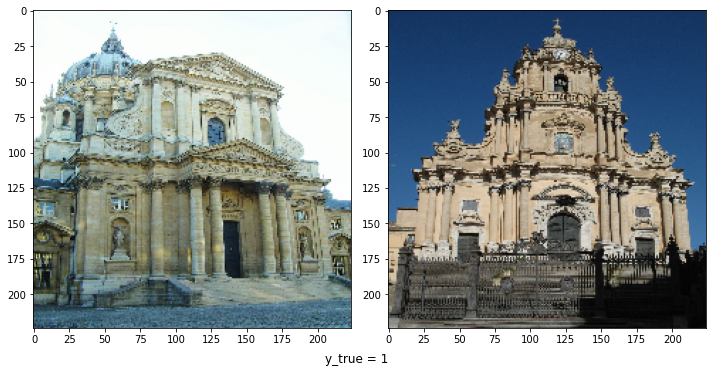

In [ ]:
_ = next_and_view(iterator1)

In [ ]:
#skip some

for ii in range(15):
    pair1 = next(iterator1)

<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> ()
-----------------------------------------------


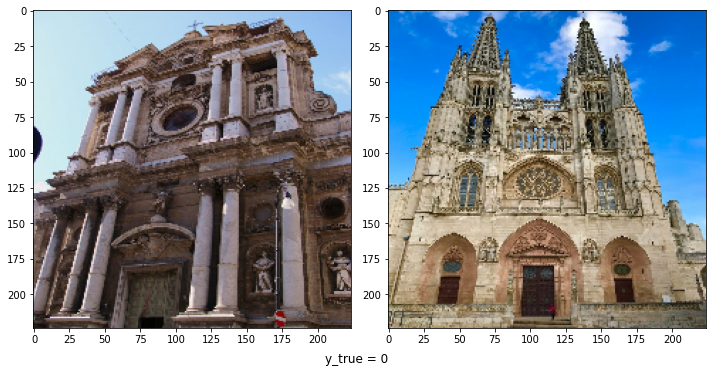

In [ ]:
_ = next_and_view(iterator1)

### The Siamese network parts 

Here we use the TF Keras functional API in creating the deep learning model.  
For the embedder part (i.e. the  feature vector module), we use a TF Hub module of ResNet V2 50 architecture, pretrained  on dataset ImageNet   
https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/4

**Download:** 

In [ ]:
!wget --spider https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/4?tf-hub-format=compressed

Spider mode enabled. Check if remote file exists.
--2020-12-05 11:32:37--  https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/4?tf-hub-format=compressed
Resolving tfhub.dev (tfhub.dev)... 64.233.184.101, 64.233.184.100, 64.233.184.102, ...
Connecting to tfhub.dev (tfhub.dev)|64.233.184.101|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://storage.googleapis.com/tfhub-modules/google/imagenet/resnet_v2_50/feature_vector/4.tar.gz [following]
Spider mode enabled. Check if remote file exists.
--2020-12-05 11:32:37--  https://storage.googleapis.com/tfhub-modules/google/imagenet/resnet_v2_50/feature_vector/4.tar.gz
Resolving storage.googleapis.com (storage.googleapis.com)... 64.233.167.128, 64.233.166.128, 74.125.133.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|64.233.167.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87742681 (84M) [application/x-tar]
Remote file exists.



In [ ]:
!mkdir -p /tmp/tfhub_models/resnet50
!curl -L "https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/4?tf-hub-format=compressed" | tar -zxvC /tmp/tfhub_models/resnet50

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0./
./assets/
./saved_model.pb
  0 83.6M    0  181k    0     0   127k      0  0:11:09  0:00:01  0:11:08 1374k./variables/
./variables/variables.index
./variables/variables.data-00000-of-00001
100 83.6M  100 83.6M    0     0  13.4M      0  0:00:06  0:00:06 --:--:-- 17.3M


In [ ]:
!tree --du -h  /tmp/tfhub_models

/tmp/tfhub_models
└── [ 91M]  resnet50
    ├── [4.0K]  assets
    ├── [1.4M]  saved_model.pb
    └── [ 90M]  variables
        ├── [ 90M]  variables.data-00000-of-00001
        └── [5.0K]  variables.index

  91M used in 3 directories, 3 files


**Build model:**

Note:

> "We expect labels y_true to be provided as 1-D integer Tensor
with shape [batch_size] of binary integer labels. And y_pred must be
1-D float Tensor with shape [batch_size] of distances between two
embedding matrices." [2]

[2] https://www.tensorflow.org/addons/api_docs/python/tfa/losses/ContrastiveLoss

The source code of the contrastive loss is available at:

https://github.com/tensorflow/addons/blob/v0.11.2/tensorflow_addons/losses/contrastive.py#L24-L60


In [ ]:
#how it works

t1 = tf.convert_to_tensor(np.array([[2,4,8]], dtype = np.float32))
t2 = tf.convert_to_tensor(np.array([[4,8,16]], dtype = np.float32))

print("t1 = ", t1)
print("t2 = ", t2)
print("-----------------------------------------------------")

dif = t1 - t2
print("t1-t2 =".ljust(15), dif)
dif_sq = tf.math.squared_difference(t1,t2)
print("(t1-t2)**2 =".ljust(15), dif_sq)
dif_sq_sum = tf.reduce_sum(dif_sq)
print("dif_sq_sum =".ljust(15), dif_sq_sum)
dist = tf.math.sqrt(dif_sq_sum)
print("dist =".ljust(15), dist)

print("-----------------------------------------------------")
d_euclid = tf.norm(t1 - t2, ord='euclidean', axis = 1)
print("d_euclid = ", d_euclid)

l2 = tf.norm(t1 - t2, ord=2, axis = 1)
print("l2 = ", l2)

l1 = tf.norm(t1 - t2, ord=1, axis = 1)
print("l1 = ", l1)

t1 =  tf.Tensor([[2. 4. 8.]], shape=(1, 3), dtype=float32)
t2 =  tf.Tensor([[ 4.  8. 16.]], shape=(1, 3), dtype=float32)
-----------------------------------------------------
t1-t2 =         tf.Tensor([[-2. -4. -8.]], shape=(1, 3), dtype=float32)
(t1-t2)**2 =    tf.Tensor([[ 4. 16. 64.]], shape=(1, 3), dtype=float32)
dif_sq_sum =    tf.Tensor(84.0, shape=(), dtype=float32)
dist =          tf.Tensor(9.165152, shape=(), dtype=float32)
-----------------------------------------------------
d_euclid =  tf.Tensor([9.165152], shape=(1,), dtype=float32)
l2 =  tf.Tensor([9.165152], shape=(1,), dtype=float32)
l1 =  tf.Tensor([14.], shape=(1,), dtype=float32)


In [ ]:
@tf.function
def func_debug_dist(x):
    """ Function is useful for inspecting the tensors as they flow through.
        Important to return the input tensor x
    """
    #tf.print("  || func_debug_dist  x = ", x)
    return x



def build_siamesenet():
    """use the TF Keras functional API to create the deep learning model.
       We include lambda layers to perform image preprocessing as part of the model, 
       so we can accept any image size at the two inputs.
    """

    tf.keras.backend.clear_session()

    #2 inputs, one for each image in the pair; use None to allow ny input size
    model_input1 = tf.keras.Input(shape=(None, None, 3), dtype=tf.uint8, name = "Input1")
    model_input2 = tf.keras.Input(shape=(None, None, 3), dtype=tf.uint8, name = "Input2")

    #resize to required size , in a lambda layer
    input1_resized = tf.keras.layers.Lambda(lambda x: tf.image.resize(x, size=(224,224), 
                                                                      method=tf.image.ResizeMethod.BILINEAR, 
                                                                      preserve_aspect_ratio=False,
                                                                      antialias=False),
                                                name = "resize1")(model_input1)
    input2_resized = tf.keras.layers.Lambda(lambda x: tf.image.resize(x, size=(224,224), 
                                                                      method=tf.image.ResizeMethod.BILINEAR, 
                                                                      preserve_aspect_ratio=False,
                                                                      antialias=False),
                                                name = "resize2")(model_input2)


    #the embeddings - start with pretrained ResNet50 
    embedder = hub.KerasLayer("/tmp/tfhub_models/resnet50",
                             trainable = True, arguments=dict(batch_norm_momentum=0.997))
    
    embeddings1 = embedder(input1_resized)
    embeddings2 = embedder(input2_resized)

    #euclidean distance
    dist_embeddings = tf.norm(embeddings1 - embeddings2, ord='euclidean', axis = 1)

    #it's not evaluated unless it's on the flow path towards computing outputs
    dist_embeddings_ = tf.keras.layers.Lambda(lambda x: func_debug_dist(x), name = "debugging")(dist_embeddings)

    #y_pred is basically the computed euclidean distance between the 2 embeddings
    model_outputs = [dist_embeddings_]

    model = tf.keras.Model(inputs = [model_input1, model_input2], 
                           outputs = model_outputs, 
                           name="siamese")

    model.compile(loss = tfa.losses.ContrastiveLoss(margin=10.0),
                  optimizer = tf.keras.optimizers.Adamax(learning_rate=0.001))
    
    return model



In [ ]:
model_siamesenet = build_siamesenet()
model_siamesenet.summary()

Model: "siamese"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input1 (InputLayer)             [(None, None, None,  0                                            
__________________________________________________________________________________________________
Input2 (InputLayer)             [(None, None, None,  0                                            
__________________________________________________________________________________________________
resize1 (Lambda)                (None, 224, 224, 3)  0           Input1[0][0]                     
__________________________________________________________________________________________________
resize2 (Lambda)                (None, 224, 224, 3)  0           Input2[0][0]                     
____________________________________________________________________________________________

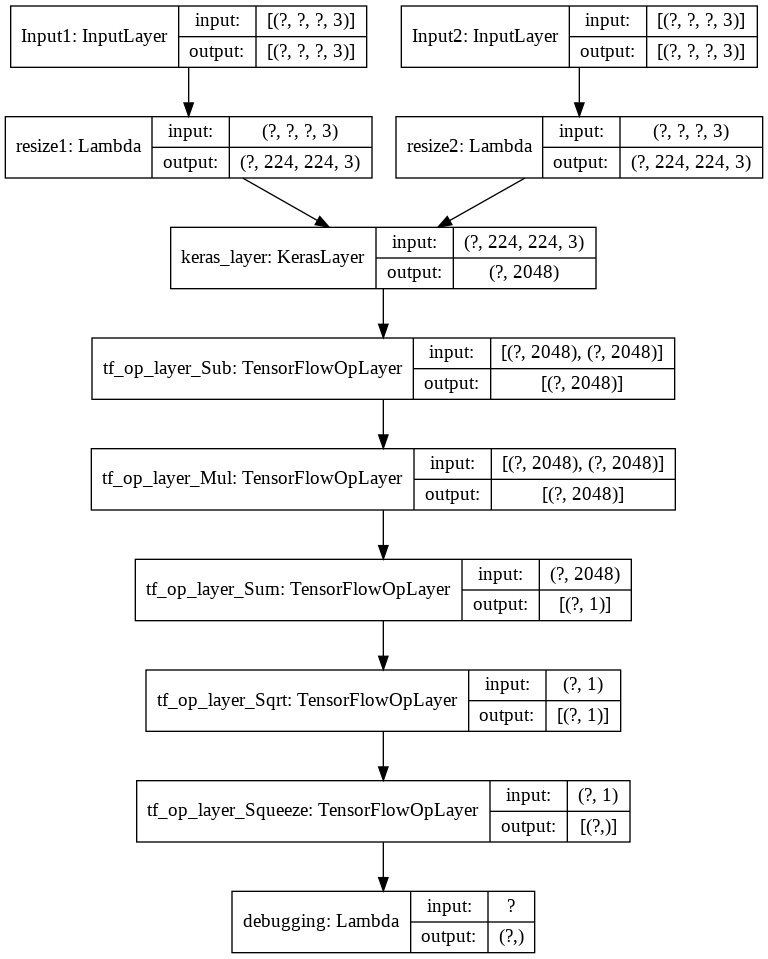

In [ ]:
tf.keras.utils.plot_model(model_siamesenet, show_shapes = True)


In [ ]:
#print layers names and seqno
for i in range(len(model_siamesenet.layers)):
    print(i, model_siamesenet.layers[i].name)

print("--------------------------------------------")

print("prediction at layer:")
print(model_siamesenet.layers[-1].name, " ||| shape:", model_siamesenet.layers[i].output_shape)

0 Input1
1 Input2
2 resize1
3 resize2
4 keras_layer
5 tf_op_layer_Sub
6 tf_op_layer_Mul
7 tf_op_layer_Sum
8 tf_op_layer_Sqrt
9 tf_op_layer_Squeeze
10 debugging
--------------------------------------------
prediction at layer:
debugging  ||| shape: (None,)


### Prior to fine-tuning, out of the box similarity metric

In [ ]:
#reset iterator

iterator1 = dataset_train.__iter__() 

#consume one
pair1 = next(iterator1)

<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> ()
-----------------------------------------------
****** PREDICTION FOR THE ENTIRE BATCH: [3933.3188 2679.9478 1854.5818 1474.7137 3062.5513 3453.7024 3888.8782
 4920.166 ]


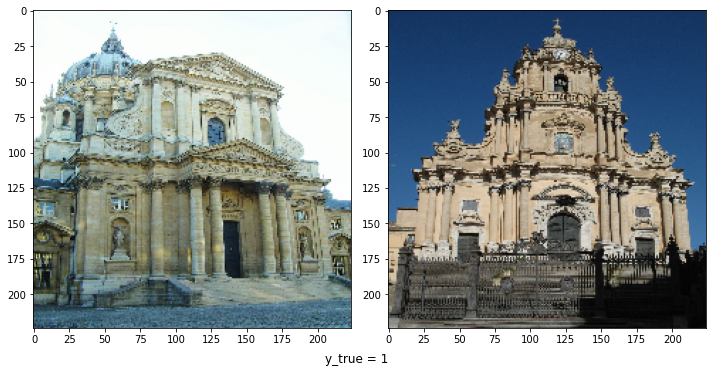

In [ ]:
a_pair_images = next_and_view(iterator1)

pred_initial = model_siamesenet.predict([a_pair_images[0], a_pair_images[1]])

print("****** PREDICTION FOR THE ENTIRE BATCH:", pred_initial )

Note: we've printed predictions for all 8 pairs in the batch, but we've displayed only first pair of images in the batch

In [ ]:
#skip some

for ii in range(15):
    pair1 = next(iterator1)

<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> ()
-----------------------------------------------
****** PREDICTION FOR THE ENTIRE BATCH: [1963.5244 2493.278  2299.6082 1773.0879 1827.6001 1964.7097 2419.293
 2238.7964]


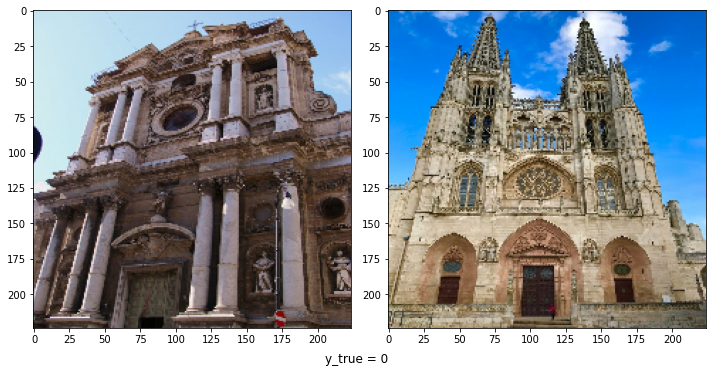

In [ ]:
a_pair_images = next_and_view(iterator1)

pred_initial = model_siamesenet.predict([a_pair_images[0], a_pair_images[1]])

print("****** PREDICTION FOR THE ENTIRE BATCH:", pred_initial )

Note: we've printed predictions for all 8 pairs in the batch, but we've displayed only first pair of images in the batch

In [ ]:
%%capture 

list_results = []

for ii,row1 in df_files.iterrows():
    filepath_seed = row1["filepath"]
    im1_tens, im1_arr = get_image(file_path = filepath_seed)
    im1_tens_batch = tf.expand_dims(im1_tens, 0)

    for jj, row2 in df_files.iterrows():
        filepath_seed = row2["filepath"]
        im2_tens, im2_arr = get_image(file_path = filepath_seed)
        im2_tens_batch = tf.expand_dims(im2_tens, 0)

        pred_initial = model_siamesenet.predict([ im1_tens_batch, im2_tens_batch ])

        #take [0] because we passed batch of 1
        list_results.append({"seed1": row1["filename"], "seed2" : row2["filename"],
                             "predicted_dist": pred_initial[0]})
        

In [ ]:
df_seed_vs_seed = pd.DataFrame(list_results)
print(df_seed_vs_seed.shape)
df_seed_vs_seed.head(10)

(900, 3)


,seed1,seed2,predicted_dist
0,baroque22.jpg,baroque22.jpg,0.000000
1,baroque22.jpg,baroque23.jpg,1750.909790
2,baroque22.jpg,baroque2.jpg,1304.176025
3,baroque22.jpg,baroque5.jpg,2182.666260
4,baroque22.jpg,baroque37.jpg,3297.766846
5,baroque22.jpg,baroque12.jpg,1802.256958
6,baroque22.jpg,baroque3.jpg,2111.190430
7,baroque22.jpg,baroque8.jpg,2616.156982
8,baroque22.jpg,baroque26.jpg,3299.693604
9,baroque22.jpg,baroque30.jpg,3408.191895


In [ ]:
#pivot table
df_seed_vs_seed_pivoted = df_seed_vs_seed.pivot(index="seed1", columns="seed2", values="predicted_dist")

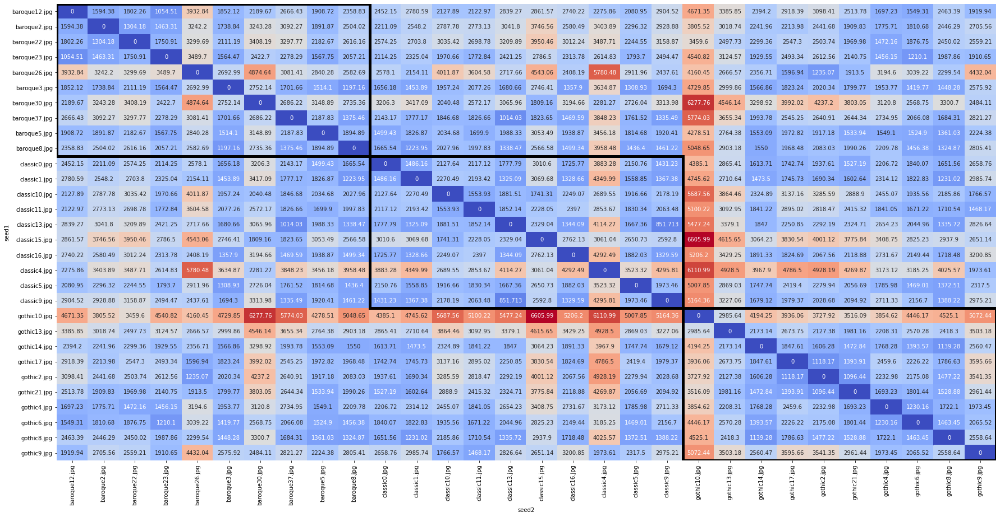

In [ ]:
fig,ax = plt.subplots(1,1, figsize=(30,15))
sns.heatmap(df_seed_vs_seed_pivoted, cmap = "coolwarm", annot= True, fmt='g', cbar=False)

#draw rectangles for intraclass
num_seeds_per_class = 10
num_classes = 3

for ii in range(num_classes): 
    rect = Rectangle((ii * num_seeds_per_class, ii * num_seeds_per_class),
                     num_seeds_per_class,num_seeds_per_class, 
                     linewidth=5,
                    edgecolor='black',
                    facecolor='none')
    ax.add_patch(rect)



We don't get satisfactory results out-of-the-box, so we do fine-tuning.

### Start training, hence fine-tuning the ResNet50 part of the model

Note: we now want to fit the model to the data, using the prepared dataset1. Now that we know the names of the inputs in the model, we can map the dataset to explicitly set:

In [ ]:
def mappings_to_model(x):
    """ Given a tuple of 3 tensors, 
        return a tuple of 2 components, consisting of 
         * a dict where 2 components of the input tuple are mapped to the 
        names of the model's inputs 
         * the label
    """

    return {
        'Input1': x[0],
        'input2': x[1]
    }, x[2]
    
    
dataset_train_ = dataset_train.map(lambda *args: mappings_to_model(args), num_parallel_calls=1)
dataset_valid_ = dataset_valid.map(lambda *args: mappings_to_model(args), num_parallel_calls=1)

In [ ]:
!rm -r -f /tmp/checkpoint_model1
!mkdir -p /tmp/checkpoint_model1

In [ ]:
checkpoint_filepath = '/tmp/checkpoint_model1'
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
                                filepath=checkpoint_filepath,
                                save_weights_only=False,
                                monitor='val_loss',
                                mode='min',
                                save_best_only=True,
                                verbose=1)

We also write a custom callback

In [ ]:
#recap when it can be triggered

[el for el in dir(tf.keras.callbacks.Callback) if el[0] != "_"]

['on_batch_begin',
 'on_batch_end',
 'on_epoch_begin',
 'on_epoch_end',
 'on_predict_batch_begin',
 'on_predict_batch_end',
 'on_predict_begin',
 'on_predict_end',
 'on_test_batch_begin',
 'on_test_batch_end',
 'on_test_begin',
 'on_test_end',
 'on_train_batch_begin',
 'on_train_batch_end',
 'on_train_begin',
 'on_train_end',
 'set_model',
 'set_params']

In [ ]:
#recap
list_pairs_train[10]

{'filepath_1': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque12.jpg',
 'filepath_2': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque3.jpg',
 'pair_type': 4}

In [ ]:
#custom callback to follow the evolution of distance between specific pairs of seed images

class progressCallback(tf.keras.callbacks.Callback):

    def __init__(self, list_pairs_tracked):
        super().__init__()
        self.list_pairs_tracked = list_pairs_tracked
        self.dict_images_pairs_tracked = {}

        for pair_tracked_id in self.list_pairs_tracked:
            pprint.pprint(pair_tracked_id)
            pair_tracked = list_pairs_train[pair_tracked_id]
            pprint.pprint(pair_tracked)
            im1_tens, im1_arr = get_image(file_path = pair_tracked["filepath_1"])
            im1_tens_batch = tf.expand_dims(im1_tens, 0)
            print(im1_tens.shape, " ===> ", im1_tens_batch.shape)
            im2_tens, im2_arr = get_image(file_path = pair_tracked["filepath_2"])
            im2_tens_batch = tf.expand_dims(im2_tens, 0)
            print(im2_tens.shape, " ===> ", im2_tens_batch.shape)
            self.dict_images_pairs_tracked[pair_tracked_id] = [im1_tens_batch, im2_tens_batch]
            print("----------------------------------------------------------------")


    def on_epoch_end(self, epoch, logs={}):
        for pair_tracked_id in self.list_pairs_tracked:
            #run prediction 
            pred_tracked_pair = self.model.predict(self.dict_images_pairs_tracked[pair_tracked_id])
            print("   ||| Trackked pair {}  |||  Prediction: {}  ".format(pair_tracked_id, pred_tracked_pair[0]))


my_progress_callback = progressCallback(list_pairs_tracked = [10, 70, 100, 140, 220, 270])
    

10
{'filepath_1': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque12.jpg',
 'filepath_2': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque3.jpg',
 'pair_type': 4}
(1600, 1306, 3)  ===>  (1, 1600, 1306, 3)
(1553, 1024, 3)  ===>  (1, 1553, 1024, 3)
----------------------------------------------------------------
70
{'filepath_1': '/content/gdrive/My Drive/architecture_fsl/seeds/classic4.jpg',
 'filepath_2': '/content/gdrive/My Drive/architecture_fsl/seeds/classic16.jpg',
 'pair_type': 5}
(1600, 1103, 3)  ===>  (1, 1600, 1103, 3)
(1600, 1066, 3)  ===>  (1, 1600, 1066, 3)
----------------------------------------------------------------
100
{'filepath_1': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque22.jpg',
 'filepath_2': '/content/gdrive/My Drive/architecture_fsl/seeds/gothic9.jpg',
 'pair_type': 1}
(1500, 1353, 3)  ===>  (1, 1500, 1353, 3)
(800, 533, 3)  ===>  (1, 800, 533, 3)
----------------------------------------------------------------
140
{'filepath_1': '

In [ ]:
hist = model_siamesenet.fit( dataset_train_, 
                             validation_data = dataset_valid_,
                             epochs = 10, 
                             shuffle = False, 
                             workers = 1,
                             verbose=1,
                             callbacks = [my_progress_callback, checkpoint_callback]
                            )

Epoch 1/10
     44/Unknown - 22s 508ms/step - loss: 29.5954   ||| Trackked pair 10  |||  Prediction: 17.259737014770508  
   ||| Trackked pair 70  |||  Prediction: 30.130126953125  
   ||| Trackked pair 100  |||  Prediction: 19.99901580810547  
   ||| Trackked pair 140  |||  Prediction: 23.146923065185547  
   ||| Trackked pair 220  |||  Prediction: 18.67658805847168  
   ||| Trackked pair 270  |||  Prediction: 14.69426155090332  

Epoch 00001: val_loss improved from inf to 113.51065, saving model to /tmp/checkpoint_model1
44/44 [==============================] - 39s 881ms/step - loss: 29.5954 - val_loss: 113.5107
Epoch 2/10
44/44 [==============================] - ETA: 0s - loss: 15.6981   ||| Trackked pair 10  |||  Prediction: 8.07914924621582  
   ||| Trackked pair 70  |||  Prediction: 9.67858600616455  
   ||| Trackked pair 100  |||  Prediction: 19.95876121520996  
   ||| Trackked pair 140  |||  Prediction: 11.855884552001953  
   ||| Trackked pair 220  |||  Prediction: 15.47122383

In [ ]:
print(hist.history.keys())

dict_keys(['loss', 'val_loss'])


Text(0.5, 0, 'epoch')

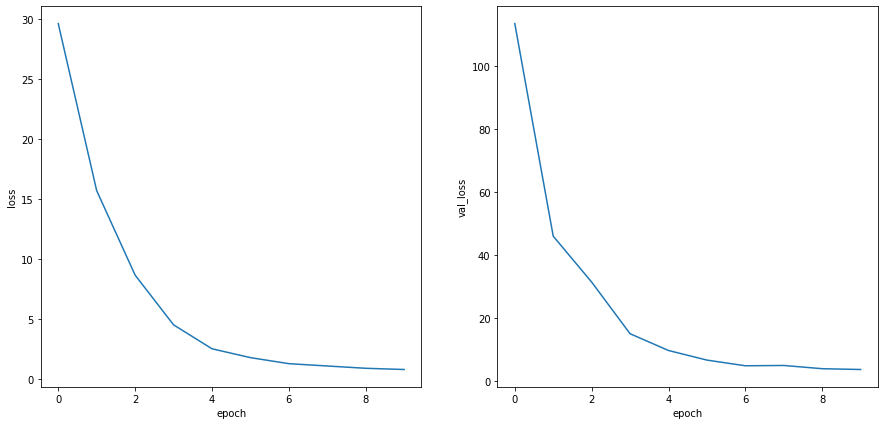

In [ ]:
#plot the evolution of loss and val_loss
fig, ax = plt.subplots(1, 2, figsize = (15, 7))
ax[0].plot(hist.history['loss'])
ax[1].plot(hist.history['val_loss'])

ax[0].set_ylabel('loss')
ax[0].set_xlabel('epoch')

ax[1].set_ylabel('val_loss')
ax[1].set_xlabel('epoch')

Note: we see how loss evolved along the training epochs, for the training set and for the validation set 

### Load the best iteration model and make predictions

In [ ]:
!tree --du -h /tmp/checkpoint_model1

/tmp/checkpoint_model1
├── [4.0K]  assets
├── [3.5M]  saved_model.pb
└── [270M]  variables
    ├── [269M]  variables.data-00000-of-00001
    └── [ 45K]  variables.index

 273M used in 2 directories, 3 files


In [ ]:
!cp -r /tmp/checkpoint_model1 "/content/gdrive/My Drive/architecture_fsl/"

In [ ]:
!tree --du -h "/content/gdrive/My Drive/architecture_fsl/checkpoint_model1"

/content/gdrive/My Drive/architecture_fsl/checkpoint_model1
├── [4.0K]  assets
├── [3.5M]  saved_model.pb
└── [270M]  variables
    ├── [269M]  variables.data-00000-of-00001
    └── [ 45K]  variables.index

 273M used in 2 directories, 3 files


In [ ]:
loaded_model_siamesenet = tf.keras.models.load_model("/tmp/checkpoint_model1")

In [ ]:
type(loaded_model_siamesenet)

tensorflow.python.keras.engine.functional.Functional

**INSPECT THE MODEL'S INPUTS AND OUTUTS**

In [ ]:
loaded_model_siamesenet.signatures

_SignatureMap({'serving_default': <ConcreteFunction signature_wrapper(Input1, Input2) at 0x7F7A3BDFFE48>})

In [ ]:
loaded_model_siamesenet_func = loaded_model_siamesenet.signatures["serving_default"]

print(type(loaded_model_siamesenet_func))

print("========================================================================")

#we can see here as well the input(s) and output(s)  of the saved model
print("INPUTS:")
print("===========")
#pprint.pprint(loaded_model_siamesenet_func.inputs)
pprint.pprint(loaded_model_siamesenet_func.structured_input_signature)
print("-----------------------------------------------------------------")
print("OUTPUTS:")
print("===========")
pprint.pprint(loaded_model_siamesenet_func.outputs)
pprint.pprint(loaded_model_siamesenet_func.structured_outputs)

<class 'tensorflow.python.saved_model.load._WrapperFunction'>
INPUTS:
((),
 {'Input1': TensorSpec(shape=(None, None, None, 3), dtype=tf.uint8, name='Input1'),
  'Input2': TensorSpec(shape=(None, None, None, 3), dtype=tf.uint8, name='Input2')})
-----------------------------------------------------------------
OUTPUTS:
[<tf.Tensor 'Identity:0' shape=(None,) dtype=float32>]
{'debugging': TensorSpec(shape=(None,), dtype=tf.float32, name='debugging')}


**INFERENCE ON PAIRS FROM THE TRAINING SET**

In [ ]:
#reset iterator to the beginning of the dataset_train

iterator1 = dataset_train.__iter__() 


<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> ()
-----------------------------------------------
****** PREDICTION FOR THE ENTIRE BATCH: [ 2.2265747  4.905364   1.3573761  2.906665   1.6202939 10.142234
  1.2456934 12.169787 ]


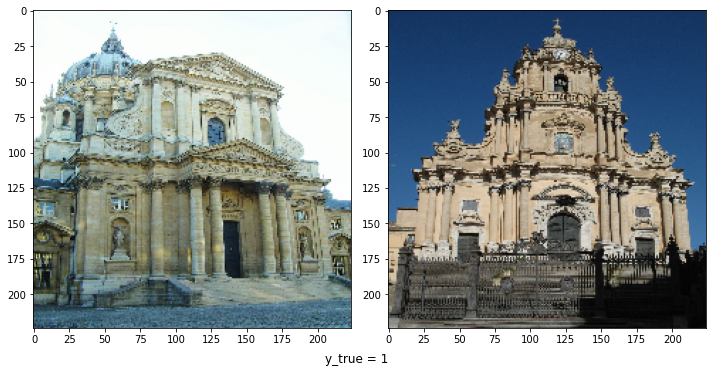

In [ ]:
a_pair_images = next_and_view(iterator1)

pred_finetuned = loaded_model_siamesenet.predict([a_pair_images[0], a_pair_images[1]])

print("****** PREDICTION FOR THE ENTIRE BATCH:", pred_finetuned )

In [ ]:
#alternatively, we could have called
pred_finetuned = loaded_model_siamesenet_func(Input1 = a_pair_images[0], 
                                              Input2 = a_pair_images[1])
print("****** PREDICTION:", pred_finetuned["debugging"] )

****** PREDICTION: tf.Tensor(
[ 2.2265747  4.905364   1.3573761  2.906665   1.6202939 10.142234
  1.2456934 12.169787 ], shape=(8,), dtype=float32)


Note the different result obtained with the loaded model from the best epoch, compared to what the model would give after all epochs:

In [ ]:
pred_finetuned = model_siamesenet.predict([a_pair_images[0], a_pair_images[1]])

print("****** PREDICTION:", pred_finetuned )

****** PREDICTION: [ 2.2265747  4.905364   1.3573761  2.906665   1.6202939 10.142234
  1.2456934 12.169787 ]


### Inference on test images

**RUN A TEST IMAGE VS EACH SEED AND REGISTER RESULTS**

In [ ]:
def test_image_vs_seeds(test_img_filepath):
    """ For the image read from test_img_filepath, extract feature vector and 
        iteratethrough all seeds used in training, computing the distance to each of them.
        It returns a list of dicts (with keys 'seed','predicted_dist')
    """

    list_results = []

    #read image and wrap it into a batch of one image
    im1_tens, im1_arr = get_image(file_path = test_img_filepath)
    im1_tens_batch = tf.expand_dims(im1_tens, 0)
    print(im1_tens.shape, " ===> ", im1_tens_batch.shape)

    for i, row in df_files.iterrows():
        filepath_seed = row["filepath"]
        im2_tens, im2_arr = get_image(file_path = filepath_seed)
        im2_tens_batch = tf.expand_dims(im2_tens, 0)

        pred_finetuned = loaded_model_siamesenet.predict([ im1_tens_batch, im2_tens_batch ])

        #take [0] because we passed batch of 1
        list_results.append({"seed": filepath_seed, "predicted_dist": pred_finetuned[0]})

    return list_results

In [ ]:
list_results = test_image_vs_seeds(test_img_filepath = FOLDER_IMAGES + "baroque9.jpg")
print("--------------------------------------------------")
#example of an item
list_results[0]

(3000, 2292, 3)  ===>  (1, 3000, 2292, 3)
--------------------------------------------------


{'predicted_dist': 4.2170463,
 'seed': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque22.jpg'}

In [ ]:
def view_nearest_matches(test_img_filepath, topn = 5):
    """  For the input file path, obtain the nearest neighbors from the set of 
        seeds used in training and visualize top 5 most similar of these.
    """

    list_results = test_image_vs_seeds(test_img_filepath = test_img_filepath)

    list_results_sorted = sorted(list_results, key = lambda x: x["predicted_dist"], reverse = False)

    fig, ax = plt.subplots(1, topn + 1, figsize = (30, 5))

    im1_tens, im1_arr = get_image(file_path = test_img_filepath)
    ax[0].imshow(im1_arr)
    ax[0].set_title("test image")

    for ii in range(topn):
        im2_tens, im2_arr = get_image(file_path = list_results_sorted[ii]["seed"])
        ax[ii + 1].imshow(im2_arr)
        filename = list_results_sorted[ii]["seed"].split("/")[-1]
        ax[ii + 1].set_title("%s (%.3f)"%(filename, round(list_results_sorted[ii]["predicted_dist"],3)))

    return list_results_sorted

----------------------
**BAROQUE**

(3000, 2292, 3)  ===>  (1, 3000, 2292, 3)


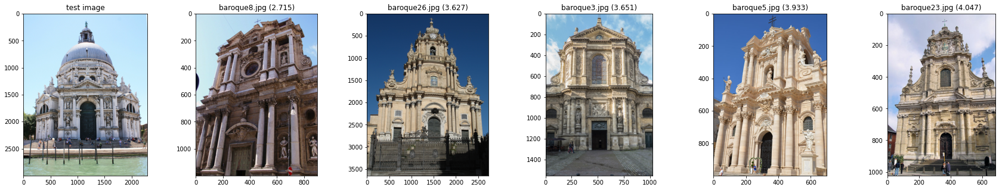

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "baroque9.jpg")

Note: 5/5 baroque as the test image

**ANOTHER ILLUSTRATION**

(1604, 1200, 3)  ===>  (1, 1604, 1200, 3)


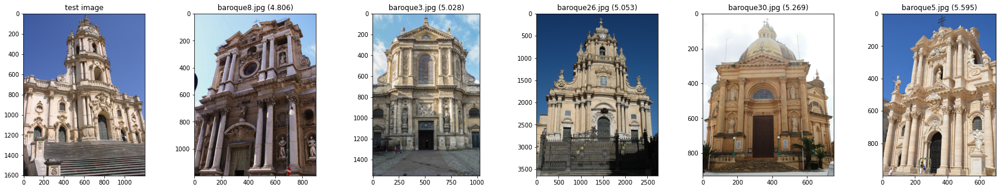

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "baroque32.jpg")

Note: 5/5 baroque as the test image 

**ANOTHER ILLUSTRATION**

(1067, 800, 3)  ===>  (1, 1067, 800, 3)


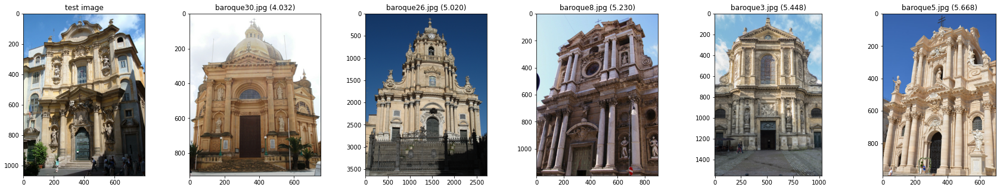

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "baroque14.jpg")

Note: 5/5 baroque as the test image

**ANOTHER ILLUSTRATION**

(676, 720, 3)  ===>  (1, 676, 720, 3)


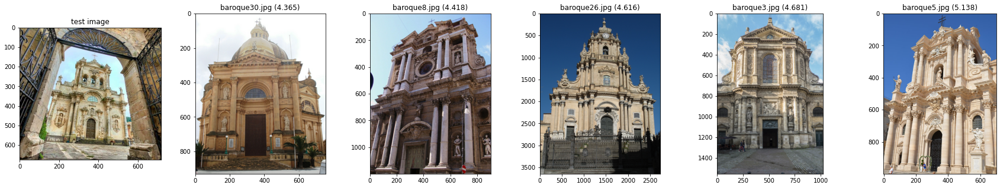

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "baroque40.jpg")

Note: 5/5 baroque as the test image

**ANOTHER ILLUSTRATION**

(1793, 1425, 3)  ===>  (1, 1793, 1425, 3)


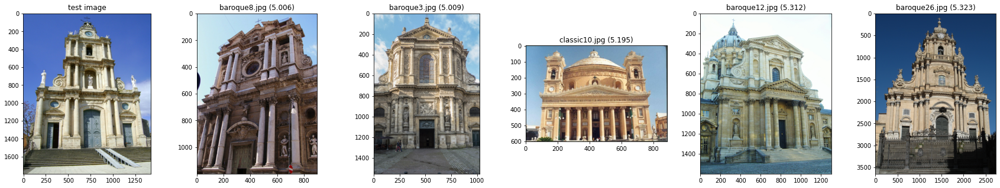

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "baroque36.jpg")

Note: 4/5 baroque as the test image

-------------------------------------
**GOTHIC**

**ANOTHER ILLUSTRATION**

(2048, 1536, 3)  ===>  (1, 2048, 1536, 3)


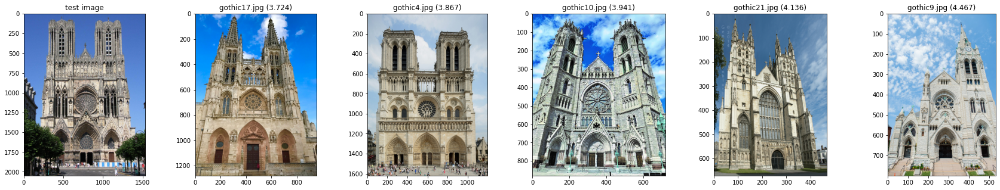

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "gothic20.jpg")

Note; 5/5 gothic as the test image

**ANOTHER ILLUSTRATION**

(1632, 1224, 3)  ===>  (1, 1632, 1224, 3)


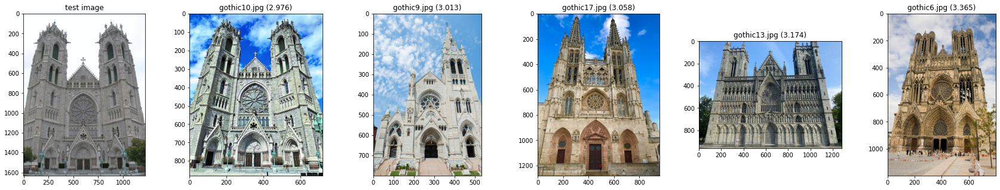

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "gothic11.jpg")

Note: 5/5 gothic as the test image

**ANOTHER ILLUSTRATION**

(1533, 1533, 3)  ===>  (1, 1533, 1533, 3)


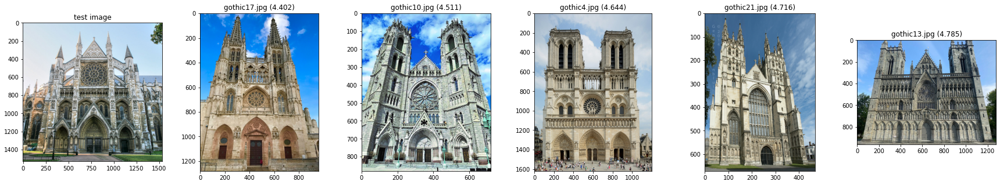

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "gothic5.jpg")

Note: 5/5 gothic as the test image

**ANOTHER ILLUSTRATION**

(750, 1140, 3)  ===>  (1, 750, 1140, 3)


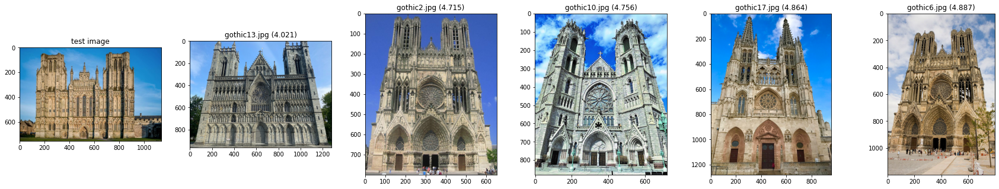

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "gothic12.jpg")

Note: 5/5 gothic as the test image

**ANOTHER ILLUSTRATION**

(2112, 2816, 3)  ===>  (1, 2112, 2816, 3)


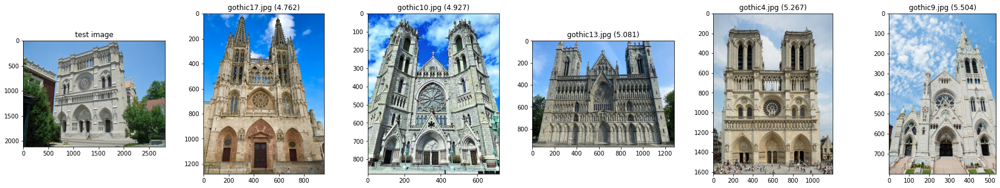

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "gothic18.jpg")

Note: 5/5 gothic as the test image

----------------------------
**CLASSIC**

**ANOTHER ILLUSTRATION**

(960, 1280, 3)  ===>  (1, 960, 1280, 3)


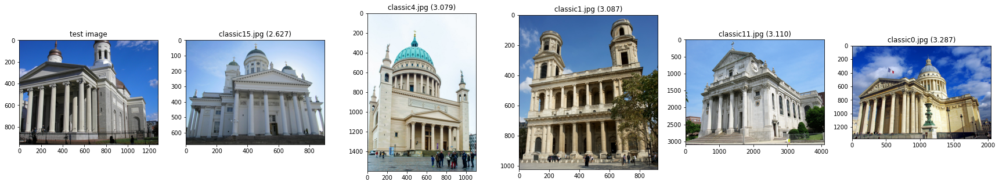

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "classic3.jpg")

Note: 5/5 classic as the test image

**ANOTHER ILLUSTRATION**

(3000, 2721, 3)  ===>  (1, 3000, 2721, 3)


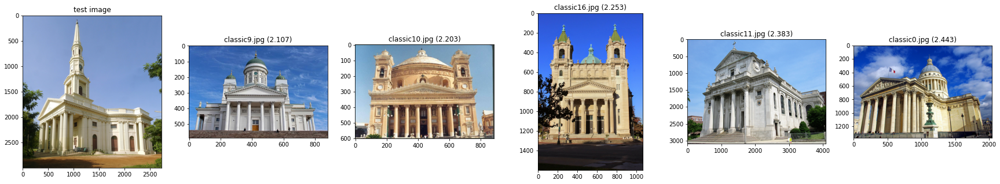

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "classic18.jpg")

Note: 5/5 classic as the test image

**ANOTHER ILLUSTRATION**

(1200, 1600, 3)  ===>  (1, 1200, 1600, 3)


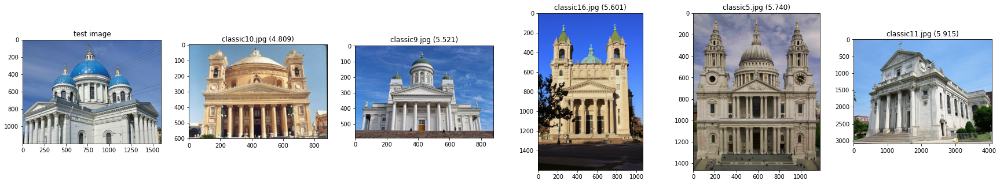

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "classic7.jpg")

Note: 5/5 classic as the test image

**ANOTHER ILLUSTRATION**

(800, 532, 3)  ===>  (1, 800, 532, 3)


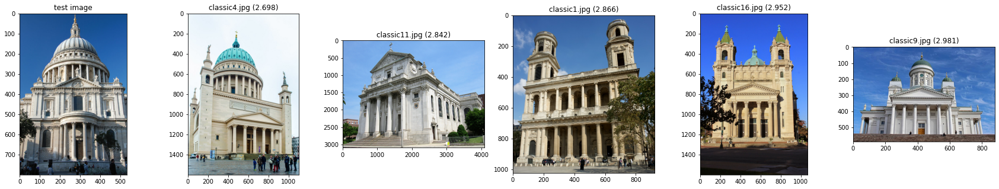

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "classic2.jpg")

Note: 5/5 classic as the test image

**ANOTHER ILLUSTRATION**

(1976, 1316, 3)  ===>  (1, 1976, 1316, 3)


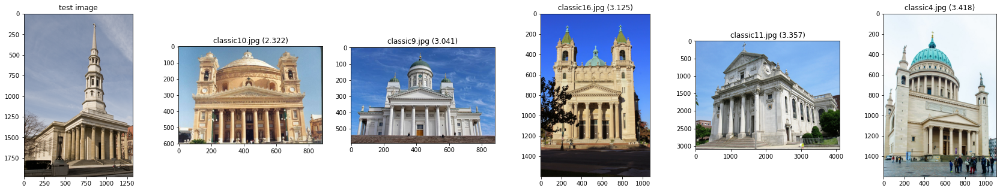

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "classic14.jpg")

Note: 5/5 classic as the test image

It generalizes well. 

## Visualize embeddings from fine-tuned ResNet50

We need to extract tensor from intermediate layer:

In [ ]:
help(loaded_model_siamesenet.get_layer)

Help on method get_layer in module tensorflow.python.keras.engine.training:

get_layer(name=None, index=None) method of tensorflow.python.keras.engine.functional.Functional instance
    Retrieves a layer based on either its name (unique) or index.
    
    If `name` and `index` are both provided, `index` will take precedence.
    Indices are based on order of horizontal graph traversal (bottom-up).
    
    Arguments:
        name: String, name of layer.
        index: Integer, index of layer.
    
    Returns:
        A layer instance.
    
    Raises:
        ValueError: In case of invalid layer name or index.



In [ ]:
layer_intermed = loaded_model_siamesenet.get_layer(name="keras_layer")

embeddings_extractor = tf.keras.models.Model(inputs = loaded_model_siamesenet.inputs[0],
                                             outputs = layer_intermed.output)

**ILLUSTRATE ON ONE IMAGE**

In [ ]:
#read image and wrap it into a batch of one image
im1_tens, im1_arr = get_image(file_path = FOLDER_IMAGES + "baroque7.jpg")
im1_tens_batch = tf.expand_dims(im1_tens, 0)
print(im1_tens.shape, " ===> ", im1_tens_batch.shape)


embeddings_image =  embeddings_extractor(im1_tens_batch)
embeddings_image.shape

(898, 1269, 3)  ===>  (1, 898, 1269, 3)


TensorShape([1, 2048])

Ok, so we've got the features vector of size 2048 as expected

**DO FOR ALL 30 CLASSES SEEDS IMAGES**

In [ ]:
dict_embedd = {}

for i,row in df_files.iterrows():
    filepath_seed = row["filepath"]
    im2_tens, im2_arr = get_image(file_path = filepath_seed)
    im2_tens_batch = tf.expand_dims(im2_tens, 0)

    embeddings_image =  embeddings_extractor(im2_tens_batch)
    dict_embedd[row["filepath"]] = embeddings_image

**REDUCE DIMENSIONALITY FROM 2048 TO 2**

In [ ]:
#we use spread to introduce some jitter, otherwise they'd overlap completely in the 3 clusters
reducer = umap.UMAP(init="random",n_components=2,spread=10.0)

In [ ]:
#stack all embeddings

arr_embeddings = None

for k,v in dict_embedd.items():
    if arr_embeddings is None:
        arr_embeddings = v.numpy().copy()
    else:
        arr_embeddings = np.vstack([arr_embeddings, v.numpy().copy()])

#should have shape (30, 2048)
arr_embeddings.shape

(30, 2048)

In [ ]:
embedding_2d = reducer.fit_transform(arr_embeddings)
embedding_2d.shape

/usr/local/lib/python3.6/dist-packages/umap/umap_.py:1158: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


(30, 2)

**PLOT MINI-IMAGES IN THE 2D SPACE**

In [ ]:
xs = embedding_2d[:,0]
ys = embedding_2d[:,1]

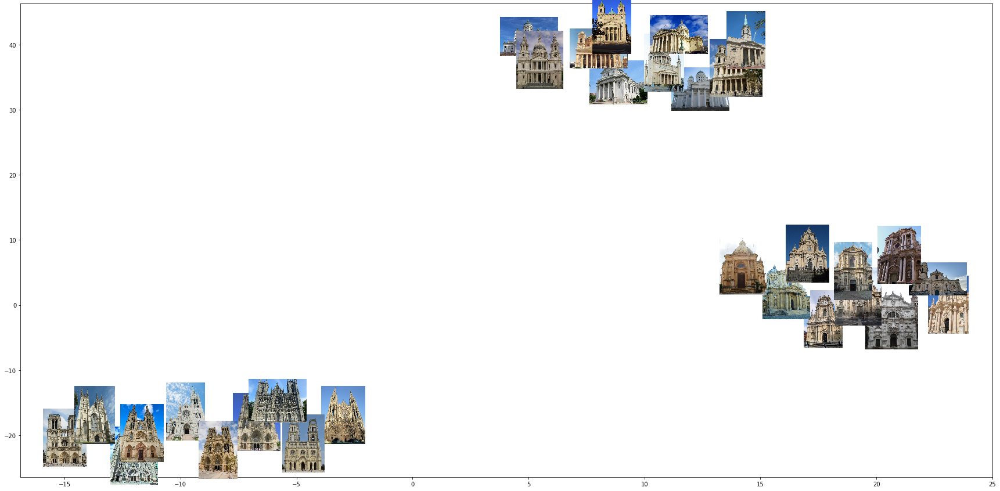

In [ ]:
fig,ax = plt.subplots(1,1, figsize = (30,15))

for i, k in enumerate(list(dict_embedd.keys())):
    filepath_seed = k
    im2_tens, im2_arr = get_image(file_path = filepath_seed)
    #adaptive zoom
    zoom_level = 100 / max(im2_arr.shape[0], im2_arr.shape[1])

    ab = AnnotationBbox(OffsetImage(im2_arr, zoom = zoom_level), (xs[i], ys[i]), frameon=False)
    ax.add_artist(ab)

#also pin the exact position in 2d
ax.scatter(x = xs, y = ys, s=500, color="red")



We can observe which classes seeds are farther from the rest of their class representatives.

### Inference results for all pairs of seeds

In [ ]:
%%capture 

list_results = []

for ii,row1 in df_files.iterrows():
    filepath_seed = row1["filepath"]
    im1_tens, im1_arr = get_image(file_path = filepath_seed)
    im1_tens_batch = tf.expand_dims(im1_tens, 0)

    for jj, row2 in df_files.iterrows():
        filepath_seed = row2["filepath"]
        im2_tens, im2_arr = get_image(file_path = filepath_seed)
        im2_tens_batch = tf.expand_dims(im2_tens, 0)

        pred_finetuned = loaded_model_siamesenet.predict([ im1_tens_batch, im2_tens_batch ])

        #take [0] because we passed batch of 1
        list_results.append({"seed1": row1["filename"], "seed2" : row2["filename"],
                             "predicted_dist": pred_finetuned[0]})
        


In [ ]:
df_seed_vs_seed = pd.DataFrame(list_results)
df_seed_vs_seed.head(10)

,seed1,seed2,predicted_dist
0,baroque22.jpg,baroque22.jpg,0.000000
1,baroque22.jpg,baroque23.jpg,1.576779
2,baroque22.jpg,baroque2.jpg,1.802859
3,baroque22.jpg,baroque5.jpg,1.546516
4,baroque22.jpg,baroque37.jpg,1.900954
5,baroque22.jpg,baroque12.jpg,2.206194
6,baroque22.jpg,baroque3.jpg,2.283945
7,baroque22.jpg,baroque8.jpg,2.887931
8,baroque22.jpg,baroque26.jpg,2.854105
9,baroque22.jpg,baroque30.jpg,5.424263


In [ ]:
#pivot table
df_seed_vs_seed_pivoted = df_seed_vs_seed.pivot(index="seed1", columns="seed2", values="predicted_dist")


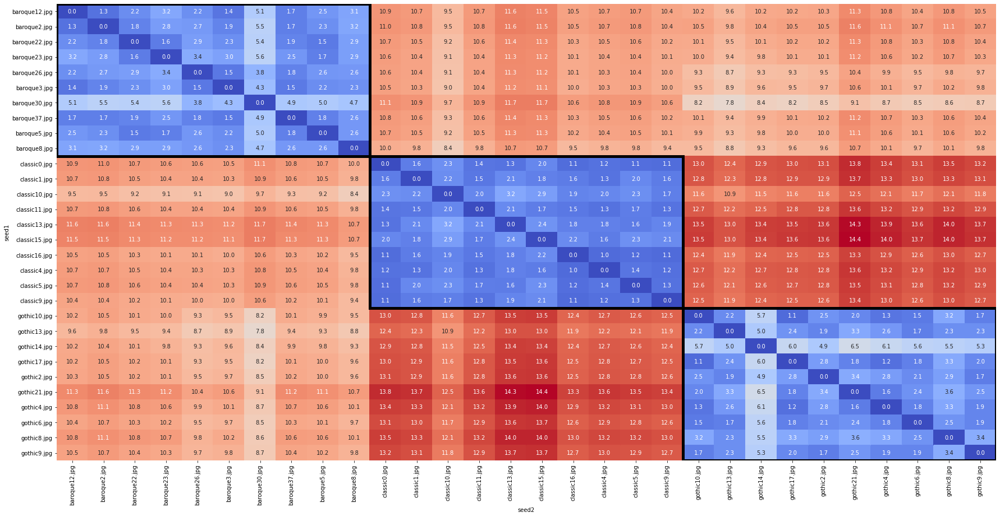

In [ ]:
fig,ax = plt.subplots(1,1, figsize=(30,15))
sns.heatmap(df_seed_vs_seed_pivoted, cmap = "coolwarm", annot= True, fmt='.1f', cbar=False)

#draw rectangles for intraclass
num_seeds_per_class = 10
num_classes = 3

for ii in range(num_classes): 
    rect = Rectangle((ii * num_seeds_per_class, ii * num_seeds_per_class),
                     num_seeds_per_class,num_seeds_per_class, 
                     linewidth=5,
                    edgecolor='black',
                    facecolor='none')
    ax.add_patch(rect)




-------------------------------------------------